# <center>Organizaci&oacute;n de Datos</center>
#### <center>C&aacute;tedra Ing. Rodriguez, Juan Manuel </center>

## <center>Trabajo Práctico 1 : Propiedades en Venta</center>
## <center>Parte 2</center>
### <center> Grupo 22 </center>
### <center> Integrantes: </center>
##### <center> Federico Martin Forte,  Francisco Sobral,  Ian Klaus von der Heyde,  Juan Pablo Aschieri,  Joaquin Rivero  </center>

# Carga de Datos y librerías

In [1]:
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gp

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.metrics import silhouette_score

from pyclustertend import hopkins
from yellowbrick.cluster import SilhouetteVisualizer

from IPython.display import Image


In [2]:
viviendas_caba_train=pd.read_csv('./Datasets/viviendas_caba_train.csv').copy()
poly = gp.read_file(r'./Datasets/barrios_procesados.geojson')

In [3]:
viviendas_caba_train_pca=pd.read_csv('./Datasets/pca_properati_argentina_2021.csv').copy()
viviendas_caba_train_pca

,cp_1,cp_2,cp_3,cp_4,property_price
0,-0.240790,2.566757,-0.302095,-0.402374,82900.0
1,0.785842,2.343504,-0.428496,-1.106511,99000.0
2,0.869961,1.052196,-0.290617,-0.045955,146000.0
3,0.406626,1.381870,0.602253,-0.380710,250000.0
4,-1.145578,1.221063,0.212389,0.412863,100000.0
...,...,...,...,...,...
92872,1.343173,-0.736078,1.242145,-0.453699,74500.0
92873,-0.180337,-0.310156,1.353966,-0.243423,75500.0
92874,-1.712313,-0.268802,1.177312,0.607994,220000.0
92875,-1.791434,-0.262480,1.180196,0.526010,161000.0


# 2. Agrupamiento

#### Analisis de tendencia al clustering

In [4]:
viviendas_caba_train.head()

,start_date,end_date,latitud,longitud,barrio,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,geometry
0,2021-12-15,2021-12-25,-34.555049,-58.490513,Saavedra,Departamento,2.0,1.0,58.0,49.0,167113.0,Departamento - Saavedra,POINT (-58.4905135 -34.5550487)
1,2021-05-20,2021-06-05,-34.546991,-58.478553,Saavedra,Departamento,2.0,1.0,48.0,44.0,129000.0,Departamento - Saavedra,POINT (-58.4785532 -34.546991)
2,2021-03-20,2021-04-16,-34.570842,-58.491805,Villa Urquiza,Departamento,2.0,1.0,62.0,58.0,124600.0,Venta Depto 2 amb Anticipo + Cuotas CAC V. Urq...,POINT (-58.4918048 -34.5708421)
3,2021-07-17,2021-10-16,-34.589251,-58.402106,Recoleta,Departamento,3.0,2.0,60.0,60.0,196000.0,Excelente 3 ambientes en venta en Barrio Recoleta,POINT (-58.4021058 -34.5892511)
4,2021-07-02,2022-02-09,-34.626290,-58.437632,Caballito,Departamento,3.0,2.0,67.0,61.0,235000.0,VENTA DEPARTAMENTO 3 AMB. EN CABALLITO,POINT (-58.4376325 -34.6262899)


In [5]:
datos_numericos = viviendas_caba_train.copy()
datos_numericos.drop(columns=['start_date','end_date','barrio', 'property_title','geometry','property_type'],inplace=True)
datos_numericos.head()

,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price
0,-34.555049,-58.490513,2.0,1.0,58.0,49.0,167113.0
1,-34.546991,-58.478553,2.0,1.0,48.0,44.0,129000.0
2,-34.570842,-58.491805,2.0,1.0,62.0,58.0,124600.0
3,-34.589251,-58.402106,3.0,2.0,60.0,60.0,196000.0
4,-34.626290,-58.437632,3.0,2.0,67.0,61.0,235000.0


Estadística de Hopkins

 Sirve para evaluar la tendencia de agrupación de un conjunto de datos midiendo la probabilidad de que un conjunto de datos dado sea generado por una distribución de datos uniforme. En otras palabras, prueba la aleatoriedad espacial de los datos.
- Si no hay clusters definidos (distribución uniforme H≅0.5)
- A mayor H mayor tendencia a clusters (Un valor de 𝐻 superior a 0.75 indica una tendencia a la
agrupación en un nivel de confianza del 90 %.)


In [6]:
hopkins(datos_numericos,datos_numericos.shape[0])

0.0006243044228332411

Dado el resultado del estadistico de Hopkins, vemos que hay una muy baja tendencia al clustering, de todos modos, sabemos que el test de Hopkins se ve muy influenciado por datos no normalizados.
Por lo que mas adelante volveremos a calcularlo con datos normalizados.


#### Cantidad de clusters

Primero utilizando el metodo del codo.

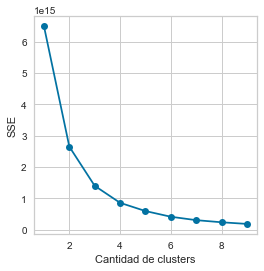

In [7]:
sse = []
list_k = list(range(1, 10))

for k in list_k:
    km = KMeans(n_clusters=k)
    km.fit(datos_numericos)
    sse.append(km.inertia_)

# Grafico el SSE por K
plt.figure(figsize=(4, 4))
plt.plot(list_k, sse, '-o')
plt.xlabel(r'Cantidad de clusters')
plt.ylabel('SSE')
plt.show()

De aqui vemos que el el "codo" de la funcion esta en 3 clusters. Igualmente podriamos utilizar tambien 4 o 5 clusters para reducir el error aún más.

Luego, calculamos el silhouette score.

In [8]:
"""list_k = list(range(2, 6))

for n_clusters in list_k:
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict(datos_numericos)

    score = silhouette_score (datos_numericos , preds)
    print ("For n_clusters =" + str(n_clusters) + " silhouette score is " + str(score))"""


'list_k = list(range(2, 6))\n\nfor n_clusters in list_k:\n    clusterer = KMeans(n_clusters=n_clusters)\n    preds = clusterer.fit_predict(datos_numericos)\n\n    score = silhouette_score (datos_numericos , preds)\n    print ("For n_clusters =" + str(n_clusters) + " silhouette score is " + str(score))'

+ For n_clusters =2 silhouette score is 0.880002032775272
+ For n_clusters =3 silhouette score is 0.7809973710012935
+ For n_clusters =4 silhouette score is 0.7051000547145564
+ For n_clusters =5 silhouette score is 0.6509882511894182

De aqui concluimos que para el Silhouette Method el numero optimo de clusters es 2. 

In [9]:
"""model = KMeans(4, random_state=0)

# Visualizamos el gráfico de silueta
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')    # Instancio el visualizador
visualizer.fit(datos_numericos)
plt.savefig('./Figures/silhouette.jpg', bbox_inches='tight')"""


"model = KMeans(4, random_state=0)\n\n# Visualizamos el gráfico de silueta\nvisualizer = SilhouetteVisualizer(model, colors='yellowbrick')    # Instancio el visualizador\nvisualizer.fit(datos_numericos)\nplt.savefig('./Figures/silhouette.jpg', bbox_inches='tight')"

Visualizamos Silhouette

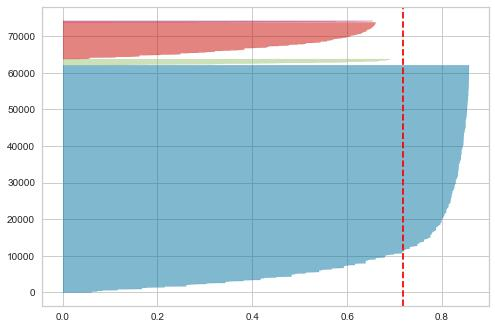

In [10]:
Image(filename ='./Figures/silhouette.jpg')

Comienzamos con el analisis de grupos.

In [11]:
print(datos_numericos.columns)

Index(['latitud', 'longitud', 'property_rooms', 'property_bedrooms',
       'property_surface_total', 'property_surface_covered', 'property_price'],
      dtype='object')


#### Analisis de grupos

##### Agrupamiento segun regla del codo

In [12]:
kmeans = KMeans(n_clusters=4, random_state=0)  #Creamos un objeto de la clase KMeans para realizar el agrupamiento
kmeans.fit(datos_numericos) #Entrenamos el algoritmo para que aprenda cómo agrupar
predict_1 = kmeans.predict(datos_numericos)

In [13]:
con_predict_1 = datos_numericos.copy()
con_predict_1['predict'] = predict_1

In [14]:
"""pairplot_cluster = sns.pairplot(con_predict, hue='predict').figure
pairplot_cluster.savefig('./Figures/pairplot_cluster1')"""

"pairplot_cluster = sns.pairplot(con_predict, hue='predict').figure\npairplot_cluster.savefig('./Figures/pairplot_cluster1')"

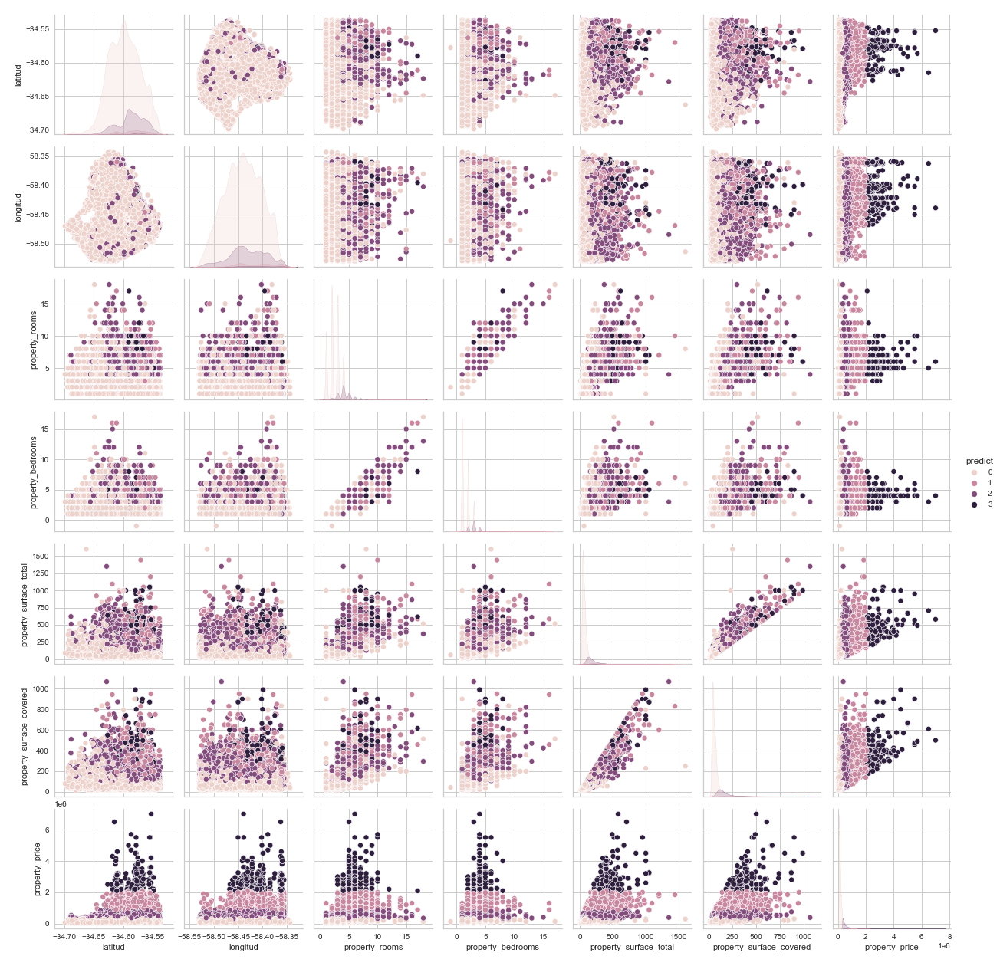

In [15]:
Image(filename = './Figures/pairplot_cluster1.png', width=1800, height=1300)

Como se puede ver en los grficos, la unica variable que pareciera que k-means toma en cuenta para realizar el agrupamiento es el precio.

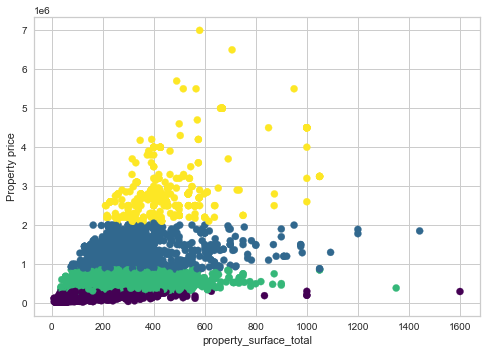

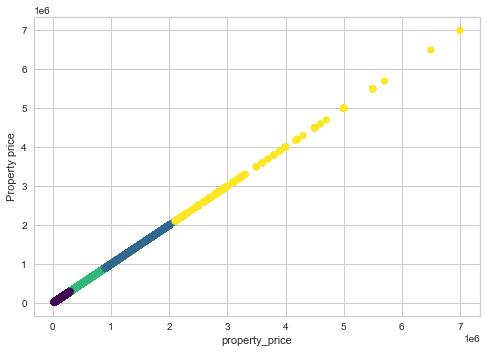

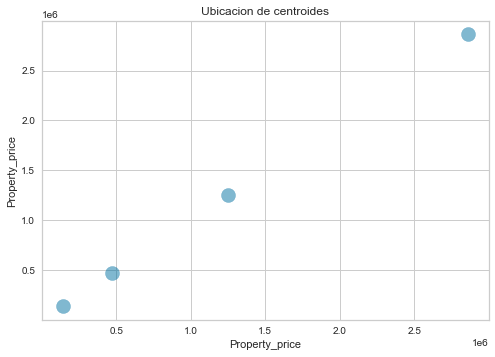

In [16]:
#Se puede ver claramente en los siguientes graficos ejemplos
for i in ['property_surface_total', 'property_price']:
    plt.scatter(datos_numericos.loc[:,i], datos_numericos.loc[:,'property_price'], c=predict_1, s=50, cmap='viridis' )
    plt.xlabel(i)
    plt.ylabel('Property price')
    plt.show()

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 6], centers[:,6],s=200, alpha=0.5)
plt.title('Ubicacion de centroides')
plt.xlabel('Property_price')
plt.ylabel('Property_price')
plt.show()

Analizamos datos generales de cada cluster

In [17]:
cluster_0 = con_predict_1[con_predict_1.predict == 0]
cluster_1 = con_predict_1[con_predict_1.predict == 1]
cluster_2 = con_predict_1[con_predict_1.predict == 2]
cluster_3 = con_predict_1[con_predict_1.predict == 3]

In [18]:
print(cluster_0.shape)
cluster_0.describe()

(62189, 8)


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,predict
count,62189.000000,62189.000000,62189.000000,62189.000000,62189.000000,62189.000000,62189.000000,62189.0
mean,-34.597670,-58.440358,2.503771,1.665697,68.523083,58.544871,139481.084629,0.0
std,0.026654,0.037561,1.120816,0.846825,42.459920,31.441797,63150.038414,0.0
min,-34.698989,-58.530391,1.000000,-1.000000,10.000000,10.000000,21285.000000,0.0
25%,-34.617241,-58.467802,2.000000,1.000000,42.000000,38.000000,89000.000000,0.0
50%,-34.598004,-58.440210,2.000000,1.000000,57.000000,50.000000,126000.000000,0.0
75%,-34.578563,-58.411530,3.000000,2.000000,80.000000,70.000000,179000.000000,0.0
max,-34.535964,-58.343239,18.000000,17.000000,1600.000000,900.000000,305000.000000,0.0


In [19]:
print(cluster_1.shape)
cluster_1.describe()

(1693, 8)


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,predict
count,1693.000000,1693.000000,1693.000000,1693.000000,1693.000000,1693.000000,1.693000e+03,1693.0
mean,-34.582165,-58.411745,5.186060,3.473125,301.995275,268.476078,1.250290e+06,1.0
std,0.020371,0.036342,1.769253,1.209700,143.946799,114.687293,3.040052e+05,0.0
min,-34.645539,-58.525256,1.000000,1.000000,77.000000,72.000000,8.690000e+05,1.0
25%,-34.593962,-58.444766,4.000000,3.000000,207.000000,185.000000,9.900000e+05,1.0
50%,-34.579962,-58.408639,5.000000,3.000000,276.000000,248.000000,1.200000e+06,1.0
75%,-34.566294,-58.382962,6.000000,4.000000,350.000000,320.000000,1.430000e+06,1.0
max,-34.537936,-58.355689,17.000000,16.000000,1442.000000,950.000000,2.050000e+06,1.0


In [20]:
print(cluster_2.shape)
cluster_2.describe()

(10019, 8)


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,predict
count,10019.000000,10019.000000,10019.000000,10019.000000,10019.000000,10019.000000,10019.000000,10019.0
mean,-34.586626,-58.430921,4.271684,3.002296,179.203713,151.963669,470804.976345,2.0
std,0.023445,0.038074,1.327582,1.028004,94.115507,73.236388,140964.890213,0.0
min,-34.691074,-58.529931,1.000000,1.000000,37.000000,28.000000,305700.000000,2.0
25%,-34.598600,-58.455119,4.000000,2.000000,119.000000,105.000000,355000.000000,2.0
50%,-34.585778,-58.433026,4.000000,3.000000,154.000000,135.000000,429500.000000,2.0
75%,-34.568430,-58.403077,5.000000,3.000000,210.000000,180.000000,550000.000000,2.0
max,-34.536144,-58.355689,18.000000,15.000000,1350.000000,1068.000000,860000.000000,2.0


In [21]:
print(cluster_3.shape)
cluster_3.describe()

(402, 8)


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,predict
count,402.000000,402.000000,402.000000,402.000000,402.000000,402.000000,4.020000e+02,402.0
mean,-34.579881,-58.408523,5.972637,3.796020,455.985075,408.427861,2.862391e+06,3.0
std,0.018558,0.030100,1.708639,0.881047,165.397835,154.128055,7.912326e+05,0.0
min,-34.626565,-58.467816,3.000000,2.000000,211.000000,180.000000,2.100000e+06,3.0
25%,-34.590923,-58.431863,5.000000,3.000000,347.000000,320.000000,2.300000e+06,3.0
50%,-34.576231,-58.408890,6.000000,4.000000,421.500000,380.000000,2.600000e+06,3.0
75%,-34.567198,-58.384223,7.000000,4.000000,500.000000,454.000000,2.988750e+06,3.0
max,-34.547911,-58.355689,17.000000,8.000000,1050.000000,990.000000,7.000000e+06,3.0


Viendo el analisis realizado, se ve que los clusters fueron formados segun el precio, ya que en los pairplot es donde se ve una diferencia mas acentuada entre clusters, y se ve que el cluster que tiene menos viviendas tiene los precios mas altos de todos, lo que tiene sentido siendo que hay pocas viviendas de precios muy altos, haciendo que las distancias entre puntos sea mayor en comparacion con las de menor precio, que estaran mucho mas densamente pobladas.

Vemos como se distribuyen los grupos en el mapa

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


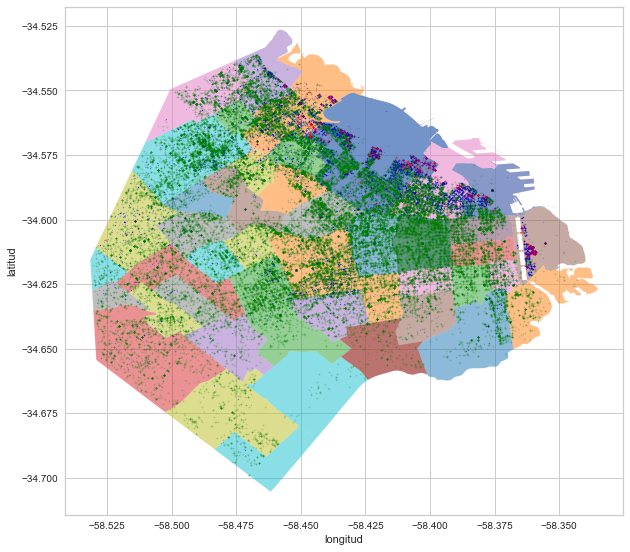

In [22]:


fig, ax = plt.subplots(figsize=(10,10))
poly.plot(ax=ax,column='BARRIO',alpha=0.5)
mapa = gp.GeoDataFrame(con_predict_1, geometry=gp.points_from_xy(con_predict_1.longitud, con_predict_1.latitud))
plt.xlabel("longitud")
plt.ylabel("latitud")
mapa[mapa.predict == 0].plot(ax=ax, color='green', alpha=0.2, markersize = 2)
mapa[mapa.predict == 1].plot(ax=ax, color='red', alpha=0.2, markersize = 2)
mapa[mapa.predict == 2].plot(ax=ax, color='blue', alpha=0.2, markersize = 1)
mapa[mapa.predict == 3].plot(ax=ax, color='purple', alpha=0.5, markersize = 2)
plt.legend()
plt.show()

#el orden de precios de los cluster es 2 - 0 - 1 - 3 

##### Agrupamiento segun Silhouette

Repetimos el análisis para un agrupamiento en 2 grupos.

In [23]:
kmeans_2 = KMeans(n_clusters=2, random_state=1)  #Creamos un objeto de la clase KMeans para realizar el agrupamiento
kmeans_2.fit(datos_numericos) #Entrenamos el algoritmo para que aprenda cómo agrupar


KMeans(n_clusters=2, random_state=1)

In [24]:
predict_2 = kmeans_2.predict(datos_numericos)
con_predict_2 = datos_numericos.copy()
con_predict_2['predict'] = predict_2
#print(con_predict_3['predict'].value_counts())

In [25]:
"""pairplot_cluster_2 = sns.pairplot(con_predict_2, hue='predict').figure
pairplot_cluster_2.savefig('./Figures/pairplot_cluster2')"""

"pairplot_cluster_2 = sns.pairplot(con_predict_2, hue='predict').figure\npairplot_cluster_2.savefig('./Figures/pairplot_cluster2')"

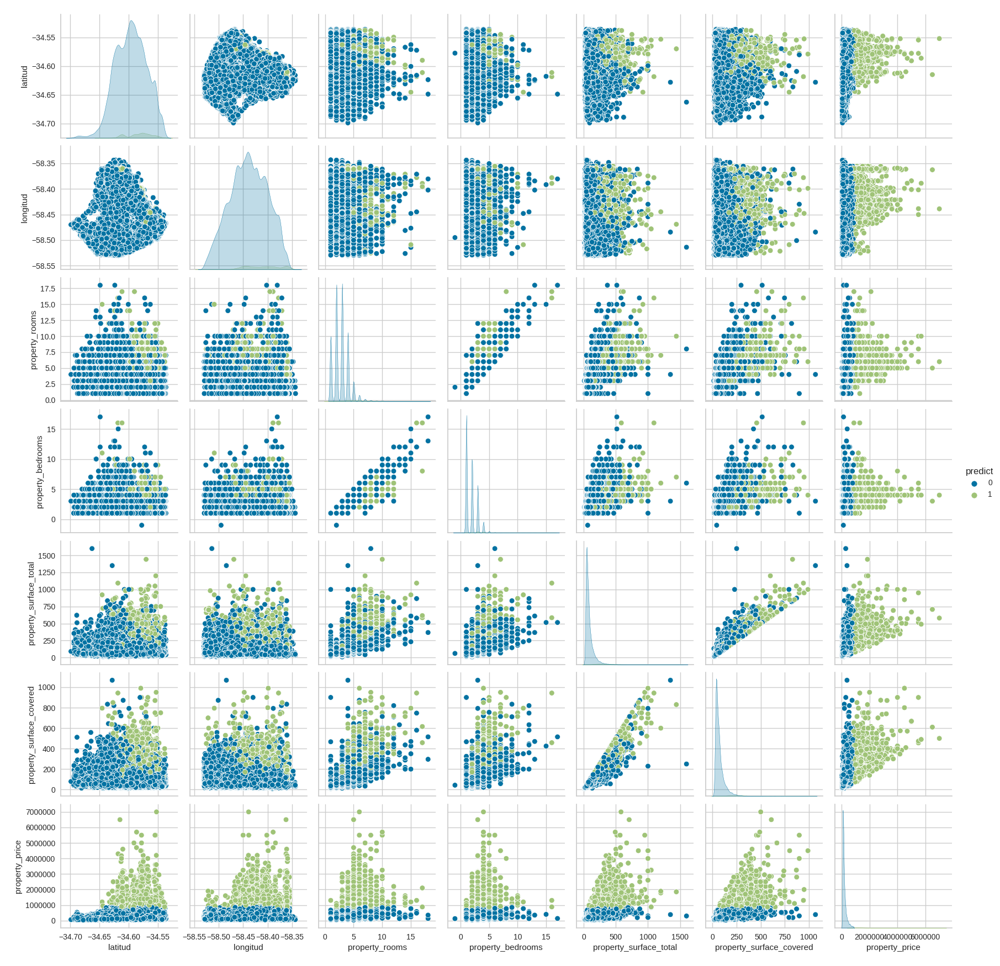

In [26]:
Image(filename = './Figures/pairplot_cluster2.png', width=1800, height=1720)

De nuevo, los clusters mas claramente definidos tienen que ver exclusivamente con el precio de la propiedad mientras que el resto de las variables no parecen tener mucha influencia.

De vuelta, imprimimimos datos generales de cada cluster.

In [27]:
cluster_nuevo_0 = con_predict_2[con_predict_2.predict == 0]
cluster_nuevo_1 = con_predict_2[con_predict_2.predict == 1]


con_predict_2.predict.value_counts()

0    72239
1     2064
Name: predict, dtype: int64

Vemos que hay aun mas diferencia entre los tama;os de los conjuntos.

In [28]:
print(cluster_nuevo_0.shape)
cluster_nuevo_0.describe()

(72239, 8)


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,predict
count,72239.000000,72239.000000,72239.000000,72239.000000,72239.000000,72239.000000,72239.000000,72239.0
mean,-34.596130,-58.439040,2.749900,1.851728,83.945431,71.570440,185747.002727,0.0
std,0.026507,0.037771,1.304349,0.989163,65.248480,51.480972,139653.185621,0.0
min,-34.698989,-58.530391,1.000000,-1.000000,10.000000,10.000000,21285.000000,0.0
25%,-34.616081,-58.465956,2.000000,1.000000,44.000000,40.000000,95000.000000,0.0
50%,-34.595830,-58.439199,3.000000,2.000000,64.000000,56.000000,140000.000000,0.0
75%,-34.577064,-58.409608,3.000000,2.000000,99.000000,83.000000,224000.000000,0.0
max,-34.535964,-58.343239,18.000000,17.000000,1600.000000,1068.000000,875000.000000,0.0


In [29]:
print(cluster_nuevo_1.shape)
cluster_nuevo_1.describe()

(2064, 8)


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,predict
count,2064.000000,2064.000000,2064.000000,2064.000000,2064.000000,2064.000000,2.064000e+03,2064.0
mean,-34.581768,-58.411018,5.346899,3.540213,332.981589,296.468992,1.569976e+06,1.0
std,0.020137,0.035395,1.791024,1.163065,160.545005,135.192981,7.742714e+05,0.0
min,-34.645539,-58.525256,1.000000,1.000000,77.000000,72.000000,8.800000e+05,1.0
25%,-34.592761,-58.442309,4.000000,3.000000,222.750000,197.000000,1.050000e+06,1.0
50%,-34.578822,-58.408407,5.000000,3.000000,300.000000,274.000000,1.300000e+06,1.0
75%,-34.567035,-58.384214,6.000000,4.000000,400.000000,359.000000,1.850000e+06,1.0
max,-34.537936,-58.355689,17.000000,16.000000,1442.000000,990.000000,7.000000e+06,1.0


Vemos que el sentido de los clusters no cambio mucho, pero si cambio su distribucion.  
De todos modos la diferencia de tamaño entre clusters es gigante: el cluster mas grande es diez veces mayor que el mediano y casi cien veces mayor que el mas chico.


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


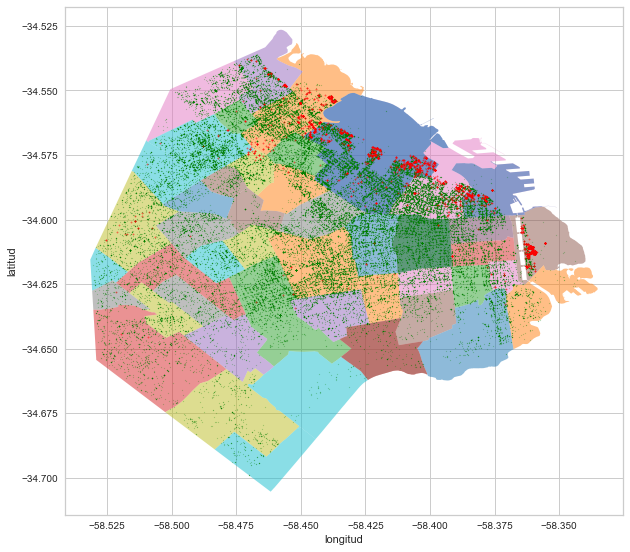

In [30]:
fig, ax = plt.subplots(figsize=(10,10))
poly.plot(ax=ax,column='BARRIO',alpha=0.5)
mapa = gp.GeoDataFrame(con_predict_2, geometry=gp.points_from_xy(con_predict_2.longitud, con_predict_2.latitud))
plt.xlabel("longitud")
plt.ylabel("latitud")
mapa[mapa.predict == 0].plot(ax=ax, color='green', alpha=0.2, markersize = 1)
mapa[mapa.predict == 1].plot(ax=ax, color='red' ,alpha=0.5, markersize = 2)
plt.legend()
plt.show()

Aqui se ve una mas clara distribucion de los clusters, con el verde, teniendo el cluster verde 36 veces mas miembros el rojo. El cluster verde se encuentra distribuido por toda la ciudad, mientras que el rojo esta mas claramente ubicados hacia el norte.
+ Los puntos verdes son las viviendas de precios hasta 875000.000000.
+ Los puntos rojos son las viviendas de precios mayores a 875000.000000.

##### Tendencia al clustering del dataset normalizado

Como el precio tiene una magnitud muchisimo mayor que el resto de las variables, puede estar escondiendo detras de esto posibles agrupamientos que no estamos teniendo en cuenta. Para evitar esto vamos a normalizar los datos. En este caso vamos a usar una normalizacion min max. De esta manera todas las variables tendran similar ingerencia.

In [31]:
scaler = preprocessing.MinMaxScaler()
datos_normalizados = scaler.fit_transform(datos_numericos)
datos_normalizados = pd.DataFrame(datos_normalizados, columns= datos_numericos.columns)
print (datos_normalizados)


        latitud  longitud  property_rooms  property_bedrooms  \
0      0.882937  0.213075        0.058824           0.111111   
1      0.932363  0.276982        0.058824           0.111111   
2      0.786059  0.206175        0.058824           0.111111   
3      0.673137  0.685459        0.117647           0.166667   
4      0.445940  0.495631        0.117647           0.166667   
...         ...       ...             ...                ...   
74298  0.349162  0.443372        0.117647           0.166667   
74299  0.762174  0.244751        0.000000           0.111111   
74300  0.431625  0.263045        0.117647           0.166667   
74301  0.631422  0.548572        0.058824           0.111111   
74302  0.832212  0.334429        0.176471           0.222222   

       property_surface_total  property_surface_covered  property_price  
0                    0.030189                  0.036862        0.020896  
1                    0.023899                  0.032136        0.015435  
2        

Volvemos a calcular la estadistica de Hopkins

In [32]:
hopkins(datos_normalizados,datos_normalizados.shape[0])

0.015046402423219144

Si bien aumento un poco tendencia al clustering, no hay dudas de que en el dataset no hay agrupamientos de datos.
Igualmente los intentaremos agrupar de la mejor forma posible

##### Agrupamiento por regla del codo normalizado

Volveremos a realizar el agrupamiento con el dataset normalizado para ver si agrupa utilizando otra combinacion de variables

In [33]:
kmeans_3 = KMeans(n_clusters=4, random_state=2 )  #Creamos un objeto de la clase KMeans para realizar el agrupamiento
kmeans_3.fit(datos_normalizados) #Entrenamos el algoritmo para que aprenda cómo agrupar

KMeans(n_clusters=4, random_state=2)

In [34]:
predict_3 = kmeans_3.predict(datos_normalizados)
con_predict_3 = datos_normalizados.copy()
con_predict_3['predict'] = predict_3

In [35]:
"""pairplot_cluster_3 = sns.pairplot(con_predict_3, hue='predict').figure
pairplot_cluster_3.savefig('./Figures/pairplot_cluster3')"""

"pairplot_cluster_3 = sns.pairplot(con_predict_3, hue='predict').figure\npairplot_cluster_3.savefig('./Figures/pairplot_cluster3')"

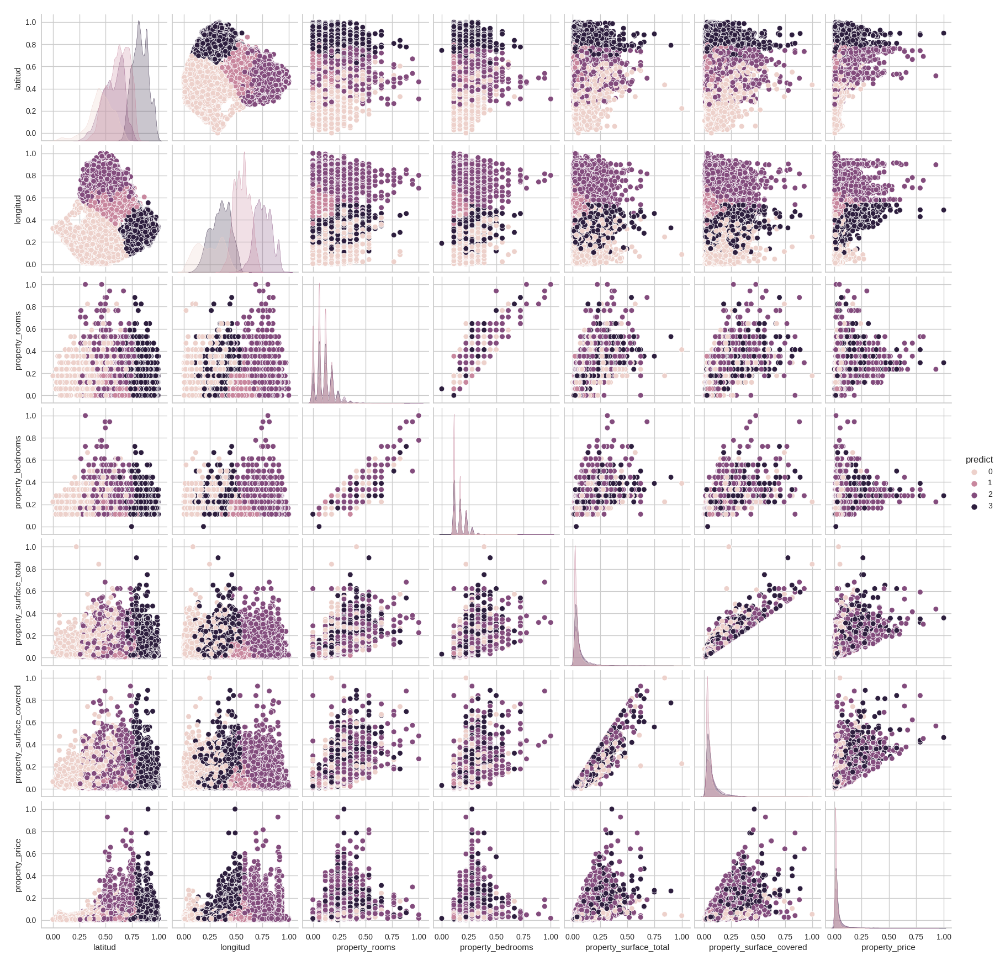

In [36]:
Image(filename = './Figures/pairplot_cluster3.png', width=1800, height=1300)

Podemos ver que efectivamente la diferencia en magnitud estaba ocacionando que k-means decida agrupar por precio. Tras normalizar termina agrupando escencialmente por latitu y longitud.

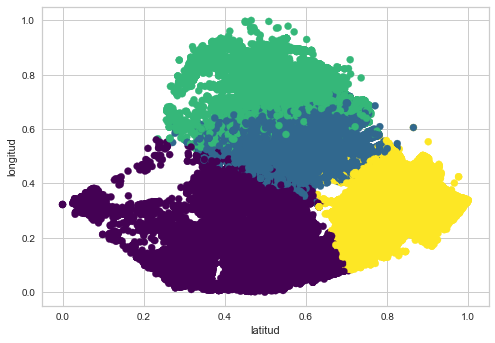

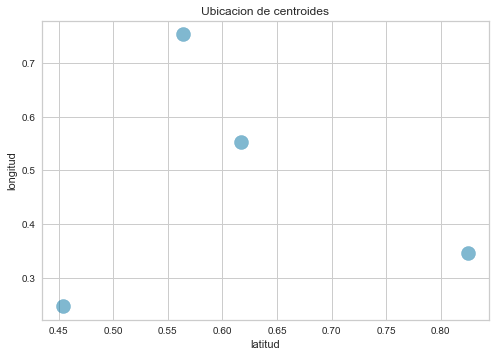

In [37]:
plt.scatter(datos_normalizados.loc[:,'latitud'], datos_normalizados.loc[:,'longitud'], c=predict_3, s=50, cmap='viridis' )
plt.xlabel('latitud')
plt.ylabel('longitud')
plt.show()

centers = kmeans_3.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], s=200, alpha=0.5)
plt.title('Ubicacion de centroides')
plt.xlabel('latitud')
plt.ylabel('longitud')
plt.show()

Analizamos datos generales de cada cluster

In [38]:
cluster_0 = con_predict_3[con_predict_3.predict == 0]
cluster_1 = con_predict_3[con_predict_3.predict == 1]
cluster_2 = con_predict_3[con_predict_3.predict == 2]
cluster_3 = con_predict_3[con_predict_3.predict == 3]

In [39]:
print(cluster_0.shape)
cluster_0.describe()

(12555, 8)


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,predict
count,12555.000000,12555.000000,12555.000000,12555.000000,12555.000000,12555.000000,12555.000000,12555.0
mean,0.453647,0.247503,0.121798,0.171171,0.058291,0.068045,0.020589,0.0
std,0.120120,0.123382,0.079196,0.058415,0.054419,0.060725,0.016970,0.0
min,0.000000,0.000000,0.000000,0.111111,0.000000,0.003781,0.000000,0.0
25%,0.387027,0.140220,0.058824,0.111111,0.025157,0.032136,0.009846,0.0
50%,0.456760,0.249908,0.117647,0.166667,0.039623,0.049149,0.015578,0.0
75%,0.535637,0.355433,0.176471,0.222222,0.069811,0.079395,0.025322,0.0
max,0.704598,0.560532,0.823529,0.666667,1.000000,1.000000,0.269206,0.0


In [40]:
print(cluster_1.shape)
cluster_1.describe()

(24087, 8)


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,predict
count,24087.000000,24087.000000,24087.000000,24087.000000,24087.000000,24087.000000,24087.000000,24087.0
mean,0.616467,0.552231,0.080002,0.142696,0.034500,0.044223,0.020185,1.0
std,0.101670,0.073090,0.061137,0.042344,0.024016,0.029253,0.017974,0.0
min,0.271378,0.329818,0.000000,0.111111,0.002516,0.003781,0.000045,1.0
25%,0.544011,0.493840,0.058824,0.111111,0.018868,0.024575,0.009703,1.0
50%,0.626786,0.553952,0.058824,0.111111,0.027673,0.035917,0.015291,1.0
75%,0.698989,0.607250,0.117647,0.166667,0.042138,0.054820,0.024032,1.0
max,0.864646,0.724618,0.411765,0.333333,0.245283,0.307183,0.312166,1.0


In [41]:
print(cluster_2.shape)
cluster_2.describe()

(17478, 8)


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,predict
count,17478.000000,17478.000000,17478.000000,17478.000000,17478.000000,17478.000000,17478.000000,17478.0
mean,0.564358,0.752725,0.132217,0.177585,0.063984,0.084498,0.041670,2.0
std,0.101898,0.080366,0.097415,0.067054,0.062581,0.082296,0.065231,0.0
min,0.234708,0.460417,0.000000,0.111111,0.000000,0.000000,0.000174,2.0
25%,0.491317,0.693045,0.058824,0.111111,0.023899,0.032136,0.009846,2.0
50%,0.578876,0.750665,0.117647,0.166667,0.043396,0.057656,0.019863,2.0
75%,0.647877,0.812722,0.176471,0.222222,0.079874,0.103970,0.044237,2.0
max,0.779219,1.000000,1.000000,1.000000,0.681132,0.926276,0.928354,2.0


In [42]:
print(cluster_3.shape)
cluster_3.describe()

(20183, 8)


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,predict
count,20183.000000,20183.000000,20183.000000,20183.000000,20183.000000,20183.000000,20183.000000,20183.0
mean,0.825175,0.347423,0.108836,0.162285,0.054387,0.067703,0.034059,3.0
std,0.072817,0.094591,0.079914,0.057015,0.055422,0.067838,0.045305,0.0
min,0.628247,0.082266,0.000000,0.000000,0.004403,0.006616,0.000847,3.0
25%,0.770422,0.277005,0.058824,0.111111,0.023899,0.030246,0.013429,3.0
50%,0.822639,0.355064,0.117647,0.166667,0.036478,0.046314,0.020737,3.0
75%,0.884416,0.424013,0.176471,0.222222,0.062893,0.076560,0.035639,3.0
max,1.000000,0.605829,0.882353,0.722222,0.900629,0.888469,1.000000,3.0


Podemos ver que en este agrupamiento los grupos tienen un nivel mucho mas parejo de integrantes a los anteriores agrupamientos, lo que se refleja en el mapa.

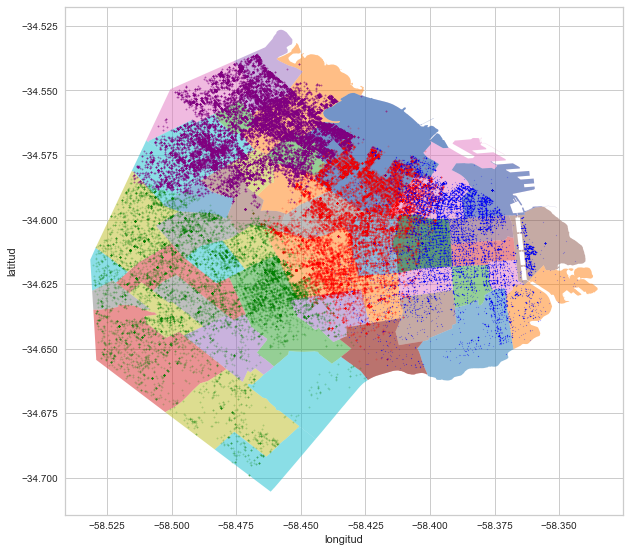

In [43]:
fig, ax = plt.subplots(figsize=(10,10))
poly.plot(ax=ax,column='BARRIO',alpha=0.5)
mapa = gp.GeoDataFrame(con_predict_3, geometry=gp.points_from_xy(datos_numericos.longitud, datos_numericos.latitud))
plt.xlabel("longitud")
plt.ylabel("latitud")
mapa[mapa.predict == 0].plot(ax=ax, color='green', alpha=0.2, markersize = 2)
mapa[mapa.predict == 1].plot(ax=ax, color='red', alpha=0.2, markersize = 2)
mapa[mapa.predict == 2].plot(ax=ax, color='blue', alpha=0.2, markersize = 1)
mapa[mapa.predict == 3].plot(ax=ax, color='purple', alpha=0.5, markersize = 2)
plt.show()

##### Agrupamiento Silhouette normalizado

Repetimos el analisis ahora teniendo en cuenta la cantidad de clusters que nos conviene segun el metodo de Silhouette

In [44]:
kmeans_4 = KMeans(n_clusters=2, random_state=3 )  #Creamos un objeto de la clase KMeans para realizar el agrupamiento
kmeans_4.fit(datos_normalizados) #Entrenamos el algoritmo para que aprenda cómo agrupar


KMeans(n_clusters=2, random_state=3)

In [45]:
predict_4 = kmeans_4.predict(datos_normalizados)
con_predict_4 = datos_normalizados.copy()
con_predict_4['predict'] = predict_4


In [46]:
"""pairplot_cluster_4 = sns.pairplot(con_predict_4, hue='predict').figure
pairplot_cluster_4.savefig('./Figures/pairplot_cluster4')"""

"pairplot_cluster_4 = sns.pairplot(con_predict_4, hue='predict').figure\npairplot_cluster_4.savefig('./Figures/pairplot_cluster4')"

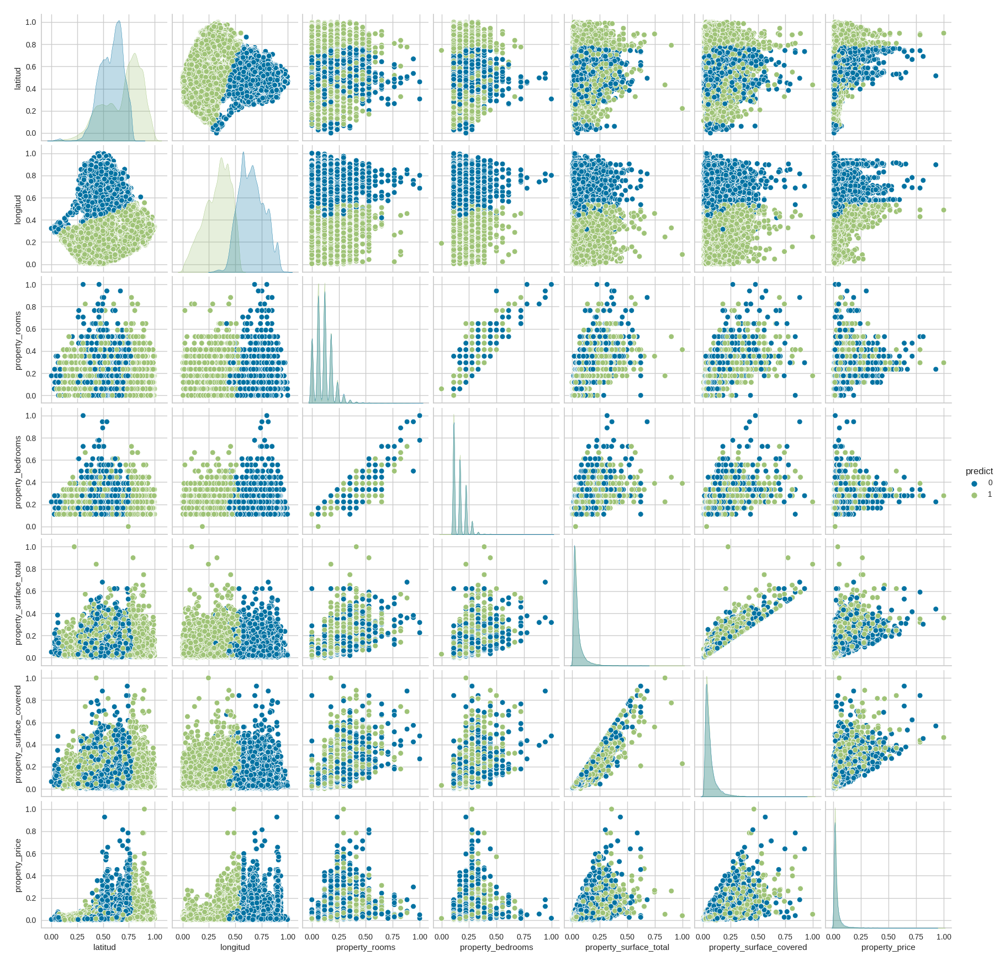

In [47]:
Image(filename = './Figures/pairplot_cluster4.png', width=1800, height=1300)


Vemos que nuevamente k-means decidio separar por latitud y longitud por sobre precio, inclusio pareciera que le da un poco mas de importancia a longitud que latitud.

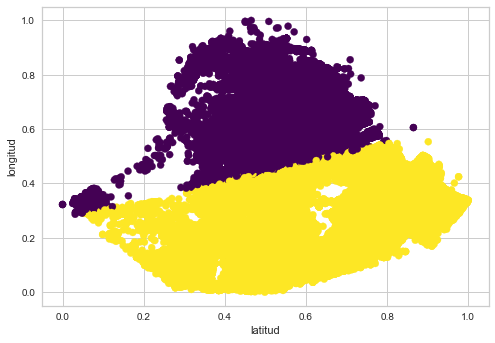

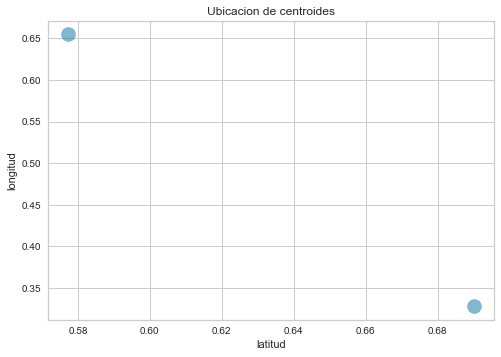

In [48]:
plt.scatter(datos_normalizados.loc[:,'latitud'], datos_normalizados.loc[:,'longitud'], c=predict_4, s=50, cmap='viridis' )
plt.xlabel('latitud')
plt.ylabel('longitud')
plt.show()

centers = kmeans_4.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], s=200, alpha=0.5)
plt.title('Ubicacion de centroides')
plt.xlabel('latitud')
plt.ylabel('longitud')
plt.show()



Ahora analizamos los datos generales de los grupos

In [49]:
cluster_0 = con_predict_4[con_predict_4.predict == 0]
cluster_1 = con_predict_4[con_predict_4.predict == 1]

In [50]:
print(cluster_0.shape)
cluster_0.describe()

(37310, 8)


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,predict
count,37310.000000,37310.000000,37310.000000,37310.000000,37310.000000,37310.000000,37310.000000,37310.0
mean,0.577351,0.654907,0.108476,0.161683,0.049666,0.064800,0.030752,0.0
std,0.112695,0.118256,0.084305,0.058490,0.049190,0.064118,0.048027,0.0
min,0.000000,0.286682,0.000000,0.111111,0.000000,0.000000,0.000102,0.0
25%,0.497616,0.566939,0.058824,0.111111,0.020755,0.028355,0.009703,0.0
50%,0.591894,0.649336,0.117647,0.166667,0.034591,0.045369,0.016868,0.0
75%,0.662440,0.742048,0.176471,0.222222,0.058491,0.075614,0.031484,0.0
max,0.864646,1.000000,1.000000,1.000000,0.681132,0.926276,0.928354,0.0


In [51]:
print(cluster_1.shape)
cluster_1.describe()

(36993, 8)


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,predict
count,36993.000000,36993.000000,36993.000000,36993.000000,36993.000000,36993.000000,36993.000000,36993.0
mean,0.689909,0.328240,0.105871,0.160382,0.052059,0.063394,0.027386,1.0
std,0.183646,0.122727,0.078799,0.056179,0.052389,0.061951,0.035646,0.0
min,0.052815,0.000000,0.000000,0.000000,0.000000,0.003781,0.000000,1.0
25%,0.551951,0.240725,0.058824,0.111111,0.023270,0.029301,0.011279,1.0
50%,0.738179,0.348312,0.117647,0.166667,0.035220,0.044423,0.018014,1.0
75%,0.831322,0.428259,0.176471,0.222222,0.059748,0.070888,0.029907,1.0
max,1.000000,0.553685,0.882353,0.722222,1.000000,1.000000,1.000000,1.0


Esta vez cada grupo tiene practicamente al misma cantidad de integrantes que el otro

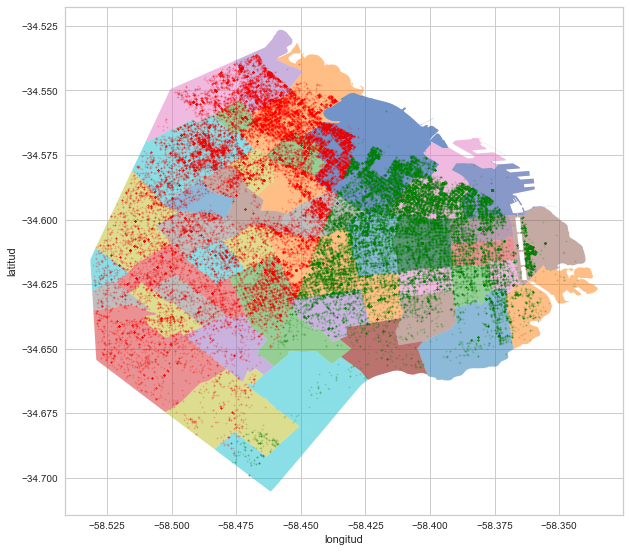

In [52]:
fig, ax = plt.subplots(figsize=(10,10))
poly.plot(ax=ax,column='BARRIO',alpha=0.5)
mapa = gp.GeoDataFrame(con_predict_4, geometry=gp.points_from_xy(datos_numericos.longitud, datos_numericos.latitud))
plt.xlabel("longitud")
plt.ylabel("latitud")
mapa[mapa.predict == 0].plot(ax=ax, color='green', alpha=0.2, markersize = 2)
mapa[mapa.predict == 1].plot(ax=ax, color='red', alpha=0.2, markersize = 2)
plt.show()

##### Conclusión

Nuestro dataset no se presta a ser agrupado ya que las variables son bastante independientes una de la otra, y porque dos viviendas tengan un mismo valor en una variable, debido a la alta varianza, en general no podemos deducir el resto.  
Es por esto que k-means termina siempre agrupando nada mas por 1 o 2 variables, ya sea el precio, si no normalizamos, o por proximidad en el mapa, latitud y longitud.